# **Pre-trained models and datasets for audio classification**

The Hugging Face Hub is home to over 500 pre-trained models for audio classification. In this section, we’ll go through some of the most common audio classification tasks and suggest appropriate pre-trained models for each. Using the pipeline() class, switching between models and tasks is straightforward - once you know how to use pipeline() for one model, you’ll be able to use it for any model on the Hub no code changes! This makes experimenting with the pipeline() class extremely fast, allowing you to quickly select the best pre-trained model for your needs.

Before we jump into the various audio classification problems, let’s quickly recap the transformer architectures typically used. The standard audio classification architecture is motivated by the nature of the task; we want to transform a sequence of audio inputs (i.e. our input audio array) into a single class label prediction. Encoder-only models first map the input audio sequence into a sequence of hidden-state representations by passing the inputs through a transformer block. The sequence of hidden-state representations is then mapped to a class label output by taking the mean over the hidden-states, and passing the resulting vector through a linear classification layer. Hence, there is a preference for encoder-only models for audio classification.

Decoder-only models introduce unnecessary complexity to the task, since they assume that the outputs can also be a sequence of predictions (rather than a single class label prediction), and so generate multiple outputs. Therefore, they have slower inference speed and tend not to be used. Encoder-decoder models are largely omitted for the same reason. These architecture choices are analogous to those in NLP, where encoder-only models such as BERT are favoured for sequence classification tasks, and decoder-only models such as GPT reserved for sequence generation tasks.

Now that we’ve recapped the standard transformer architecture for audio classification, let’s jump into the different subsets of audio classification and cover the most popular models!

# **Transformers Installation**
At the time of writing, the latest updates required for audio classification pipeline are only on the main version of the 🤗 Transformers repository, rather than the latest PyPi version. To make sure we have these updates locally, we’ll install Transformers from the main branch with the following command:

In [1]:
pip install git+https://github.com/huggingface/transformers

  Cloning https://github.com/huggingface/transformers to /tmp/pip-req-build-yxu7obgm
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers /tmp/pip-req-build-yxu7obgm
  Resolved https://github.com/huggingface/transformers to commit fe3c8ab1af558b95f67f5fafc0c55f09fd2b09db
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 98.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 68.8 MB/s eta 0:00:00
  Created wheel for transformers: filename=transformers-4.32.0.dev0-py3-none-any.whl size=7459091 sha256=08a5cef06ffd88c3992d602c1f49a79305ad769370ee936ebcef6085e1c994ea
  Stored in directory: /tmp/pip-ephem-wheel-cache-ulsihc67/wheels/c0/14/d6/6c9a5582d2ac191ec0a483be151a4495fe1eb2a6706ca49f1b
Successfully

# **Keyword Spotting**
Keyword spotting (KWS) is the task of identifying a keyword in a spoken utterance. The set of possible keywords forms the set of predicted class labels. Hence, to use a pre-trained keyword spotting model, you should ensure that your keywords match those that the model was pre-trained on. Below, we’ll introduce two datasets and models for keyword spotting.



# **Minds-14**
Let’s go ahead and use the same MINDS-14 dataset that you have explored in the previous unit. If you recall, MINDS-14 contains recordings of people asking an e-banking system questions in several languages and dialects, and has the intent_class for each recording. We can classify the recordings by intent of the call.

In [3]:
pip install datasets[audio]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.3/519.3 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.1 MB/s eta 0:00:00


In [4]:
from datasets import load_dataset

minds = load_dataset("PolyAI/minds14", name="en-AU", split="train")

Generating train split: 0 examples [00:00, ? examples/s]

We’ll load the checkpoint "anton-l/xtreme_s_xlsr_300m_minds14", which is an XLS-R model fine-tuned on MINDS-14 for approximately 50 epochs. It achieves 90% accuracy over all languages from MINDS-14 on the evaluation set.

In [5]:
from transformers import pipeline

classifier = pipeline(
    "audio-classification",
    model="anton-l/xtreme_s_xlsr_300m_minds14",
)

Finally, we can pass a sample to the classification pipeline to make a prediction:

In [6]:
classifier(minds[0]["path"])

[{'score': 0.9623644948005676, 'label': 'pay_bill'},
 {'score': 0.028678642585873604, 'label': 'freeze'},
 {'score': 0.0034296344965696335, 'label': 'card_issues'},
 {'score': 0.0020604985766112804, 'label': 'abroad'},
 {'score': 0.0008625703048892319, 'label': 'high_value_payment'}]

Great! We’ve identified that the intent of the call was paying a bill, with probability 96%. You can imagine this kind of keyword spotting system being used as the first stage of an automated call centre, where we want to categorise incoming customer calls based on their query and offer them contextualised support accordingly.

# **Speech Commands**
Speech Commands is a dataset of spoken words designed to evaluate audio classification models on simple command words. The dataset consists of 15 classes of keywords, a class for silence, and an unknown class to include the false positive. The 15 keywords are single words that would typically be used in on-device settings to control basic tasks or launch other processes.

A similar model is running continuously on your mobile phone. Here, instead of having single command words, we have ‘wake words’ specific to your device, such as “Hey Google” or “Hey Siri”. When the audio classification model detects these wake words, it triggers your phone to start listening to the microphone and transcribe your speech using a speech recognition model.

The audio classification model is much smaller and lighter than the speech recognition model, often only several millions of parameters compared to several hundred millions for speech recognition. Thus, it can be run continuously on your device without draining your battery! Only when the wake word is detected is the larger speech recognition model launched, and afterwards it is shut down again. We’ll cover transformer models for speech recognition in the next Unit, so by the end of the course you should have the tools you need to build your own voice activated assistant!

As with any dataset on the Hugging Face Hub, we can get a feel for the kind of audio data it has present without downloading or committing it memory. After heading to the Speech Commands’ dataset card on the Hub, we can use the Dataset Viewer to scroll through the first 100 samples of the dataset, listening to the audio files and checking any other metadata information:

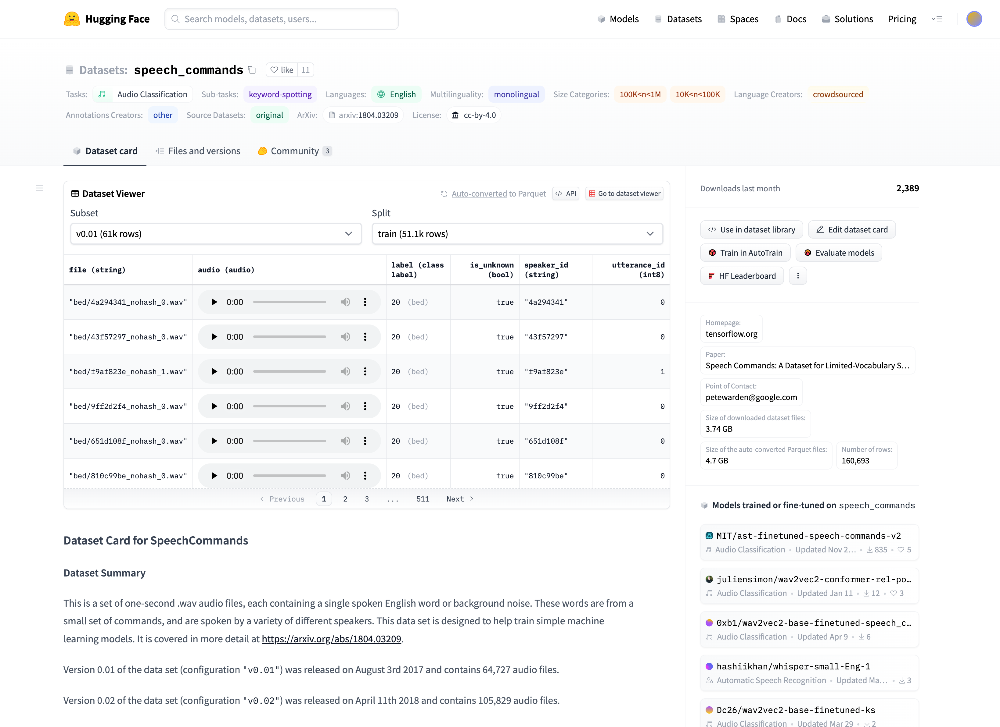

The Dataset Preview is a brilliant way of experiencing audio datasets before committing to using them. You can pick any dataset on the Hub, scroll through the samples and listen to the audio for the different subsets and splits, gauging whether it’s the right dataset for your needs. Once you’ve selected a dataset, it’s trivial to load the data so that you can start using it.

Let’s do exactly that and load a sample of the Speech Commands dataset using streaming mode:

In [7]:
speech_commands = load_dataset(
    "speech_commands", "v0.02", split="validation", streaming=True
)
sample = next(iter(speech_commands))

We’ll load an official Audio Spectrogram Transformer checkpoint fine-tuned on the Speech Commands dataset, under the namespace "MIT/ast-finetuned-speech-commands-v2":

In [8]:
classifier = pipeline(
    "audio-classification", model="MIT/ast-finetuned-speech-commands-v2"
)
classifier(sample["audio"])

[{'score': 0.9999892711639404, 'label': 'backward'},
 {'score': 1.7504938796264469e-06, 'label': 'happy'},
 {'score': 6.703040185129794e-07, 'label': 'follow'},
 {'score': 5.805890168630867e-07, 'label': 'stop'},
 {'score': 5.614535893982975e-07, 'label': 'up'}]

Now, you might be wondering how we’ve selected these pre-trained models to show you in these audio classification examples. The truth is, finding pre-trained models for your dataset and task is very straightforward! The first thing we need to do is head to the Hugging Face Hub and click on the “Models” tab: https://huggingface.co/models

This is going to bring up all the models on the Hugging Face Hub, sorted by downloads in the past 30 days:

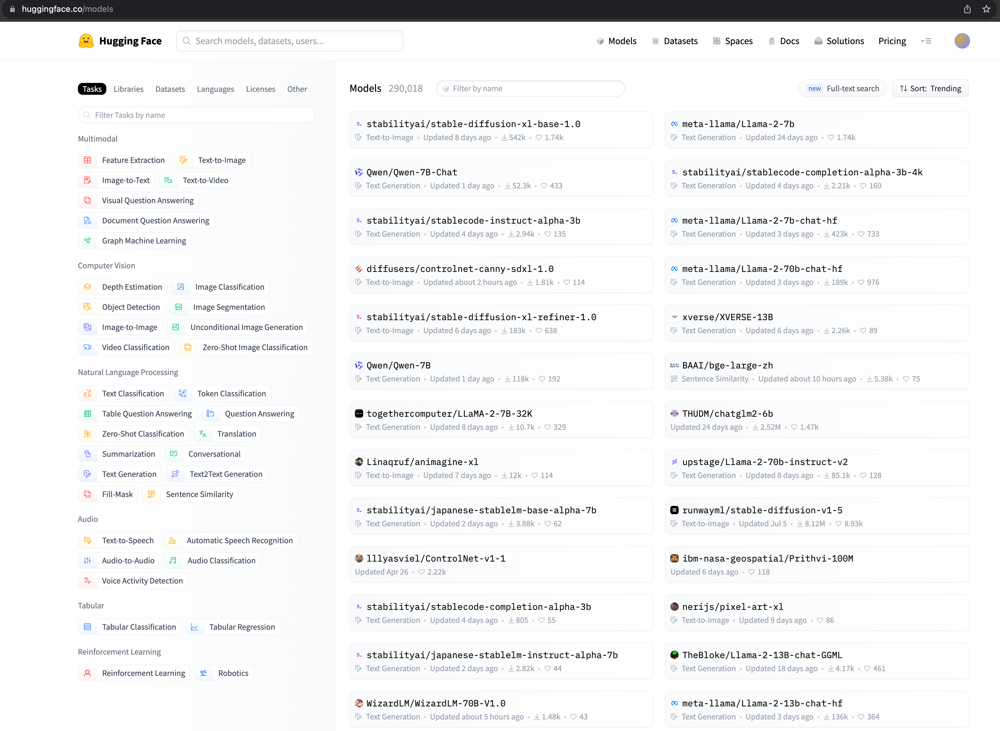

You’ll notice on the left-hand side that we have a selection of tabs that we can select to filter models by task, library, dataset, etc. Scroll down and select the task “Audio Classification” from the list of audio tasks:

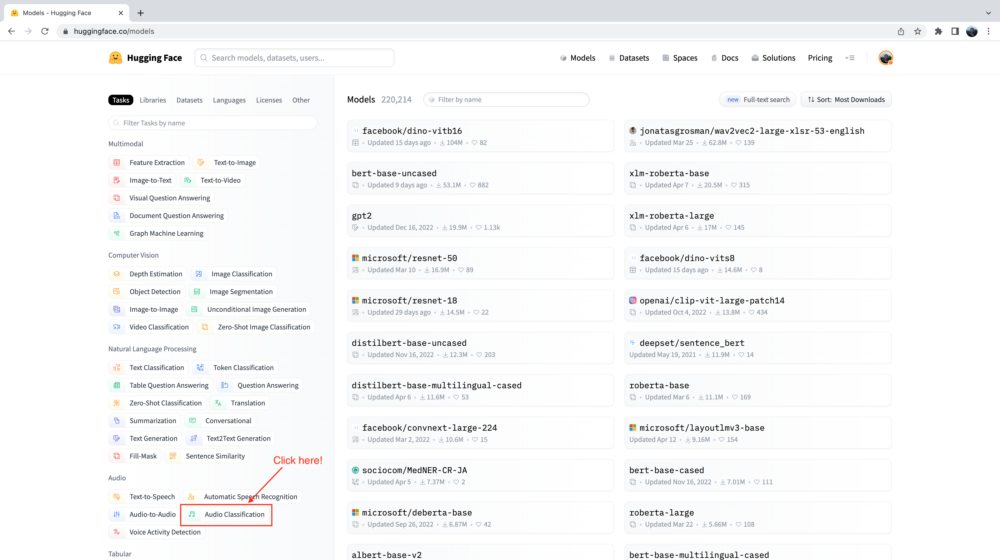

We’re now presented with the sub-set of 500+ audio classification models on the Hub. To further refine this selection, we can filter models by dataset. Click on the tab “Datasets”, and in the search box type “speech_commands”. As you begin typing, you’ll see the selection for speech_commands appear underneath the search tab. You can click this button to filter all audio classification models to those fine-tuned on the Speech Commands dataset:

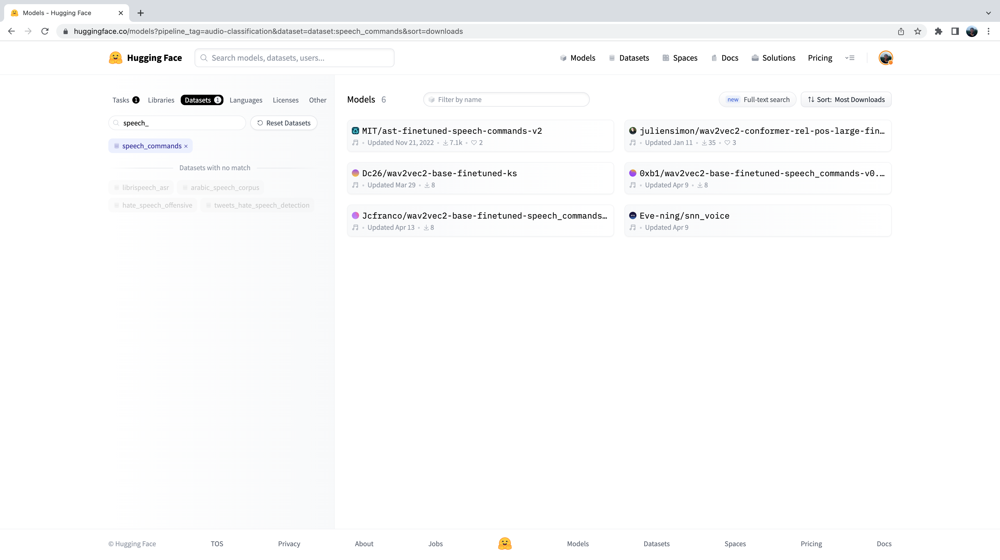

Great! We see that we have 6 pre-trained models available to us for this specific dataset and task. You’ll recognise the first of these models as the Audio Spectrogram Transformer checkpoint that we used in the previous example. This process of filtering models on the Hub is exactly how we went about selecting the checkpoint to show you!

# **Language Identification**
Language identification (LID) is the task of identifying the language spoken in an audio sample from a list of candidate languages. LID can form an important part in many speech pipelines. For example, given an audio sample in an unknown language, an LID model can be used to categorise the language(s) spoken in the audio sample, and then select an appropriate speech recognition model trained on that language to transcribe the audio.



# **FLEURS**
FLEURS (Few-shot Learning Evaluation of Universal Representations of Speech) is a dataset for evaluating speech recognition systems in 102 languages, including many that are classified as ‘low-resource’. Take a look at the FLEURS dataset card on the Hub and explore the different languages that are present: google/fleurs. Can you find your native tongue here? If not, what’s the most closely related language?

Let’s load up a sample from the validation split of the FLEURS dataset using streaming mode:

In [20]:
fleurs = load_dataset("google/fleurs", "all", split="validation", streaming=True)
sample = next(iter(fleurs))

Great! Now we can load our audio classification model. For this, we’ll use a version of Whisper fine-tuned on the FLEURS dataset, which is currently the most performant LID model on the Hub:

In [21]:
classifier = pipeline(
    "audio-classification", model="sanchit-gandhi/whisper-medium-fleurs-lang-id"
)

We can then pass the audio through our classifier and generate a prediction:

In [22]:
classifier(sample["audio"])

[{'score': 0.9999330043792725, 'label': 'Afrikaans'},
 {'score': 7.093003659974784e-06, 'label': 'Northern-Sotho'},
 {'score': 4.269145392754581e-06, 'label': 'Icelandic'},
 {'score': 3.266111207267386e-06, 'label': 'Danish'},
 {'score': 3.258066044509178e-06, 'label': 'Cantonese Chinese'}]

We can see that the model predicted the audio was in Afrikaans with extremely high probability (near 1). The FLEURS dataset contains audio data from a wide range of languages - we can see that possible class labels include Northern-Sotho, Icelandic, Danish and Cantonese Chinese amongst others. You can find the full list of languages on the dataset card here: google/fleurs.

Over to you! What other checkpoints can you find for FLEURS LID on the Hub? What transformer models are they using under-the-hood?

# **Zero-Shot Audio Classification**
In the traditional paradigm for audio classification, the model predicts a class label from a pre-defined set of possible classes. This poses a barrier to using pre-trained models for audio classification, since the label set of the pre-trained model must match that of the downstream task. For the previous example of LID, the model must predict one of the 102 langauge classes on which it was trained. If the downstream task actually requires 110 languages, the model would not be able to predict 8 of the 110 languages, and so would require re-training to achieve full coverage. This limits the effectiveness of transfer learning for audio classification tasks.

Zero-shot audio classification is a method for taking a pre-trained audio classification model trained on a set of labelled examples and enabling it to be able to classify new examples from previously unseen classes. Let’s take a look at how we can achieve this!

Currently, 🤗 Transformers supports one kind of model for zero-shot audio classification: the CLAP model. CLAP is a transformer-based model that takes both audio and text as inputs, and computes the similarity between the two. If we pass a text input that strongly correlates with an audio input, we’ll get a high similarity score. Conversely, passing a text input that is completely unrelated to the audio input will return a low similarity.

We can use this similarity prediction for zero-shot audio classification by passing one audio input to the model and multiple candidate labels. The model will return a similarity score for each of the candidate labels, and we can pick the one that has the highest score as our prediction.

Let’s take an example where we use one audio input from the Environmental Speech Challenge (ESC) dataset:

In [23]:
dataset = load_dataset("ashraq/esc50", split="train", streaming=True)
audio_sample = next(iter(dataset))["audio"]["array"]

Repo card metadata block was not found. Setting CardData to empty.


We then define our candidate labels, which form the set of possible classification labels. The model will return a classification probability for each of the labels we define. This means we need to know a-priori the set of possible labels in our classification problem, such that the correct label is contained within the set and is thus assigned a valid probability score. Note that we can either pass the full set of labels to the model, or a hand-selected subset that we believe contains the correct label. Passing the full set of labels is going to be more exhaustive, but comes at the expense of lower classification accuracy since the classification space is larger (provided the correct label is our chosen subset of labels):

In [24]:
candidate_labels = ["Sound of a dog", "Sound of vacuum cleaner"]

We can run both through the model to find the candidate label that is most similar to the audio input:

In [25]:
classifier = pipeline(
    task="zero-shot-audio-classification", model="laion/clap-htsat-unfused"
)
classifier(audio_sample, candidate_labels=candidate_labels)

[{'score': 0.9997242093086243, 'label': 'Sound of a dog'},
 {'score': 0.00027583056362345815, 'label': 'Sound of vacuum cleaner'}]

Alright! The model seems pretty confident we have the sound of a dog - it predicts it with 99.96% probability, so we’ll take that as our prediction. Let’s confirm whether we were right by listening to the audio sample (don’t turn up your volume too high or else you might get a jump!):

In [27]:
from IPython.display import Audio

Audio(audio_sample, rate=16000)

Perfect! We have the sound of a dog barking 🐕, which aligns with the model’s prediction. Have a play with different audio samples and different candidate labels - can you define a set of labels that give good generalisation across the ESC dataset? Hint: think about where you could find information on the possible sounds in ESC and construct your labels accordingly!

You might be wondering why we don’t use the zero-shot audio classification pipeline for all audio classification tasks? It seems as though we can make predictions for any audio classification problem by defining appropriate class labels a-priori, thus bypassing the constraint that our classification task needs to match the labels that the model was pre-trained on. This comes down to the nature of the CLAP model used in the zero-shot pipeline: CLAP is pre-trained on generic audio classification data, similar to the environmental sounds in the ESC dataset, rather than specifically speech data, like we had in the LID task. If you gave it speech in English and speech in Spanish, CLAP would know that both examples were speech data 🗣️ But it wouldn’t be able to differentiate between the languages in the same way a dedicated LID model is able to.

# **What next?**
We’ve covered a number of different audio classification tasks and presented the most relevant datasets and models that you can download from the Hugging Face Hub and use in just several lines of code using the pipeline() class. These tasks included keyword spotting, language identification and zero-shot audio classification.

But what if we want to do something new? We’ve worked extensively on speech processing tasks, but this is only one aspect of audio classification. Another popular field of audio processing involves music. While music has inherently different features to speech, many of the same principles that we’ve learnt about already can be applied to music.

In the following section, we’ll go through a step-by-step guide on how you can fine-tune a transformer model with 🤗 Transformers on the task of music classification. By the end of it, you’ll have a fine-tuned checkpoint that you can plug into the pipeline() class, enabling you to classify songs in exactly the same way that we’ve classified speech here!